In [2]:
# -*- coding: utf-8 -*
import os
import re
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import keras
import warnings
from keras.utils import np_utils
from keras.layers.convolutional import Conv2D, MaxPooling2D
from keras.models import Sequential, load_model
from keras.layers.core import Dense, Dropout, Activation, Flatten
from keras.preprocessing.image import array_to_img, img_to_array, load_img
from keras.optimizers import RMSprop
from keras.utils import to_categorical
from keras.backend import tensorflow_backend
from keras import layers
from keras import models
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from sklearn import datasets
import scipy.linalg as LA
import cv2
import tensorflow as tf

In [3]:
config = tf.ConfigProto(gpu_options = tf.GPUOptions(allow_growth = True))
session = tf.Session(config = config)
tensorflow_backend.set_session(session)

In [4]:
def list_pictures(directory, ext='jpg|jpeg|bmp|png|ppm'):
    return [os.path.join(root, f)
            for root, _, files in os.walk(directory) for f in files
            if re.match(r'([\w]+\.(?:' + ext + '))', f.lower())]

In [5]:
x = []
y = []
X_eva = []
Y_eva = []

print("人工物画像のテストデータを取得してます...")
for filepath in list_pictures('../data/CNN_data/test/j_test/'):
    warnings.filterwarnings('ignore')
    img_eva = img_to_array(load_img(filepath, target_size=(128, 128)))        
    X_eva.append(img_eva)
    Y_eva.append(0) # 教師データ（正解）


print("人工物画像のテストデータを取得しました")

    
#学習データの取得（非正解画像）
print("自然物画像のテストデータを取得してます...")
for filepath in list_pictures('../data/CNN_data/test/s_test/'):
    img_eva = img_to_array(load_img(filepath, target_size=(128, 128)))
    X_eva.append(img_eva)
    Y_eva.append(1) # 教師データ（正解）

print("自然物画像のテストデータを取得しました")
    
x = X_eva
y = Y_eva
X = X_eva
Y = Y_eva
# NumPy配列に変換
X_eva = np.asarray(X_eva)
Y_eva = np.asarray(Y_eva)
    
#X_eva = X_eva.reshape(X_eva.shape[0], 128, 128)

# float32型に変換
X_eva = X_eva.astype('float32')

# 正規化(0～1)
X_eva = X_eva / 255.0


print("テストデータをzca白色化しています...")
#テストデータにzca白色化   
datagen = ImageDataGenerator(zca_whitening=True)
g = datagen.flow(X_eva, Y_eva, X_eva.shape[0], shuffle=False)
x_zcaw_eva, Y_eva = g.next()
#x_zcaw_eva = X_eva.reshape(X_eva.shape[0], -1)
#zcaw_eva = ZCAWhitening().fit(x_zcaw_eva)
#x_zcaw_eva = zcaw_eva.transform(x_zcaw_eva).reshape(X_eva.shape)
print("テストデータをzca白色化しました")
    
Y_eva_2 = to_categorical(Y_eva)
    
# 学習用データとテストデータに分割
x_test = x_zcaw_eva
#x_test = X_eva
y_test = Y_eva_2
    

人工物画像のテストデータを取得してます...
人工物画像のテストデータを取得しました
自然物画像のテストデータを取得してます...
自然物画像のテストデータを取得しました
テストデータをzca白色化しています...
テストデータをzca白色化しました


In [6]:
model = load_model('main_color.h5')

label = model.predict(x_test)
    
y_pred = model.predict_classes(x_test)

sum_j = 0
sum_s = 0
for i in range(x_test.shape[0]):
    if i < (x_test.shape[0] / 2):
        if y_pred[i] == 0:
            sum_j = sum_j + 1
            
    else:
        if y_pred[i] == 1:
            sum_s = sum_s + 1
                     
print("人工物画像",sum_j / (x_test.shape[0] / 2) * 100,"%")
print("自然物画像",sum_s / (x_test.shape[0] / 2) * 100,"%")
print("全体画像",(sum_s + sum_j) / x_test.shape[0] * 100,"%")

人工物画像 88.75 %
自然物画像 96.0 %
全体画像 92.375 %


In [8]:
#model.summary()
print(label[1])
print(np.argmax(label[1]))

output = model.output[:, np.argmax(label[1])]
last_layer = model.get_layer('conv2d_52')
grads = K.gradients(output, last_layer.output)[0]

pooled_grads = K.mean(grads, axis=(0, 1, 2))
print(pooled_grads)
iterate = K.function([model.input], [pooled_grads, last_layer.output[0]])
print("a")
print(iterate)
pooled_grads_value, conv_layer_output_value = iterate([x])

for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]
    
heatmap = np.mean(conv_layer_output_value, axis=-1)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)

[1. 0.]
0
Tensor("Mean:0", shape=(512,), dtype=float32)
a


ResourceExhaustedError: OOM when allocating tensor with shape[1600,64,128,128] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: conv2d_40/convolution = Conv2D[T=DT_FLOAT, data_format="NCHW", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](conv2d_40/convolution-0-TransposeNHWCToNCHW-LayoutOptimizer, conv2d_40/kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[Node: strided_slice_1/_715 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_500_strided_slice_1", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.


Caused by op 'conv2d_40/convolution', defined at:
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 486, in start
    self.io_loop.start()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tornado/platform/asyncio.py", line 127, in start
    self.asyncio_loop.run_forever()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/asyncio/base_events.py", line 422, in run_forever
    self._run_once()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/asyncio/base_events.py", line 1432, in _run_once
    handle._run()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/asyncio/events.py", line 145, in _run
    self._callback(*self._args)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tornado/ioloop.py", line 759, in _run_callback
    ret = callback()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 536, in <lambda>
    self.io_loop.add_callback(lambda : self._handle_events(self.socket, 0))
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 450, in _handle_events
    self._handle_recv()
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 480, in _handle_recv
    self._run_callback(callback, msg)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/zmq/eventloop/zmqstream.py", line 432, in _run_callback
    callback(*args, **kwargs)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tornado/stack_context.py", line 276, in null_wrapper
    return fn(*args, **kwargs)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 283, in dispatcher
    return self.dispatch_shell(stream, msg)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 233, in dispatch_shell
    handler(stream, idents, msg)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/kernelbase.py", line 399, in execute_request
    user_expressions, allow_stdin)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/ipkernel.py", line 208, in do_execute
    res = shell.run_cell(code, store_history=store_history, silent=silent)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/ipykernel/zmqshell.py", line 537, in run_cell
    return super(ZMQInteractiveShell, self).run_cell(*args, **kwargs)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2662, in run_cell
    raw_cell, store_history, silent, shell_futures)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2785, in _run_cell
    interactivity=interactivity, compiler=compiler, result=result)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2903, in run_ast_nodes
    if self.run_code(code, result):
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2963, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<ipython-input-6-c7c8cd7a514c>", line 1, in <module>
    model = load_model('main_color.h5')
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/models.py", line 270, in load_model
    model = model_from_config(model_config, custom_objects=custom_objects)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/models.py", line 347, in model_from_config
    return layer_module.deserialize(config, custom_objects=custom_objects)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/layers/__init__.py", line 55, in deserialize
    printable_module_name='layer')
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/utils/generic_utils.py", line 144, in deserialize_keras_object
    list(custom_objects.items())))
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/models.py", line 1412, in from_config
    model.add(layer)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/models.py", line 497, in add
    layer(x)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/engine/topology.py", line 619, in __call__
    output = self.call(inputs, **kwargs)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/layers/convolutional.py", line 168, in call
    dilation_rate=self.dilation_rate)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/keras/backend/tensorflow_backend.py", line 3341, in conv2d
    data_format=tf_data_format)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 780, in convolution
    return op(input, filter)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 868, in __call__
    return self.conv_op(inp, filter)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 520, in __call__
    return self.call(inp, filter)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/ops/nn_ops.py", line 204, in __call__
    name=self.name)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/ops/gen_nn_ops.py", line 956, in conv2d
    data_format=data_format, dilations=dilations, name=name)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/op_def_library.py", line 787, in _apply_op_helper
    op_def=op_def)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 3392, in create_op
    op_def=op_def)
  File "/home/tsunei/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/ops.py", line 1718, in __init__
    self._traceback = self._graph._extract_stack()  # pylint: disable=protected-access

ResourceExhaustedError (see above for traceback): OOM when allocating tensor with shape[1600,64,128,128] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[Node: conv2d_40/convolution = Conv2D[T=DT_FLOAT, data_format="NCHW", dilations=[1, 1, 1, 1], padding="SAME", strides=[1, 1, 1, 1], use_cudnn_on_gpu=true, _device="/job:localhost/replica:0/task:0/device:GPU:0"](conv2d_40/convolution-0-TransposeNHWCToNCHW-LayoutOptimizer, conv2d_40/kernel/read)]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[Node: strided_slice_1/_715 = _Recv[client_terminated=false, recv_device="/job:localhost/replica:0/task:0/device:CPU:0", send_device="/job:localhost/replica:0/task:0/device:GPU:0", send_device_incarnation=1, tensor_name="edge_500_strided_slice_1", tensor_type=DT_FLOAT, _device="/job:localhost/replica:0/task:0/device:CPU:0"]()]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.



Cross tabulation


col_0,0,1
row_0,,
0,710,32
1,90,768


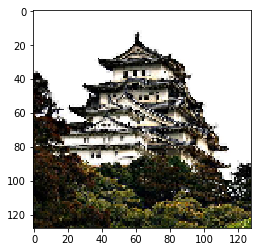

In [10]:
img_eva = img_to_array(load_img('../svm/195.jpg', target_size=(128, 128)))
img_eva = img_eva.astype(np.int32)
plt.imshow(img_eva)
# 正誤表
print('Cross tabulation')
y_pred = model.predict_classes(x_test)
pd.crosstab(y_pred, Y_eva) 

(1600, 128, 128, 3)
(1600, 3, 128, 128)
(1600, 128, 128, 3)
(1600, 3, 128, 128)
122


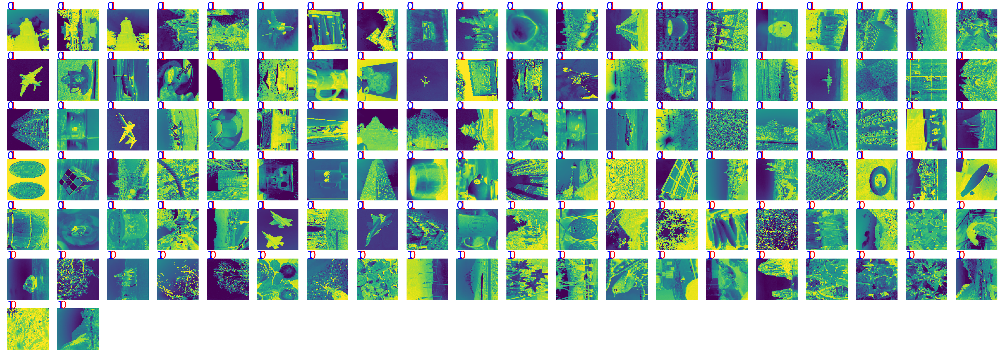

In [11]:
print(x_test.shape)
X_test = x_test.transpose(0, 3, 2, 1)
print(X_test.shape)

X = np.asarray(X)
print(X.shape)
X = X.transpose(0, 3, 2, 1)
X = X.astype(np.int32)
print(X.shape)

# そこで実際に、間違いの数字を見る。
# 青ラベル：実際の数字；赤ラベル：間違えて予測した数字
test_wrong = [im for im in zip(X_test, y_pred, Y_eva)
              if im[1] != im[2]]
print(len(test_wrong))

plt.figure(figsize=(64, 64))
for ind, val in enumerate(test_wrong):
    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)
    plt.subplot(20, 20, ind + 1)
    im = 1 - val[0][0]
    plt.axis("off")
    plt.imshow(im)
    plt.text(8, 0, val[1], fontsize=50, color='red')
    plt.text(0, 0, val[2], fontsize=50, color='blue')
#     break

In [12]:
# 正しく評価した/していないimageを取得する関数
def get_imgs(num, flg_correct=True):
    if flg_correct:
        mask = (Y_eva == num) & (y_pred == Y_eva)
    else:
        mask = (Y_eva == num) & (y_pred != Y_eva)
    return X_test[mask], y_pred[mask]

In [13]:
# 2層目まで（convolution -> relu)を取得
layers = model.layers[:8] 


# 新しいmodel(model2)にlayerを入れる
model2 = Sequential()
for layer in layers:
    model2.add(layer)
model2.compile(loss='binary_crossentropy', optimizer='rmsprop')  # compileするだけ (loss, optimizerは使わない)

In [14]:
# Kerasでは、以下のように簡単にレイヤーごとのパラメータが取得できる
lays = model.layers[:14] # list of the layers
for i, l in enumerate(lays):
    print(i+1, l)
w1 = model.layers[0].get_weights()[0] # 1層目（i=0）のレイヤーのweights
b1 = model.layers[0].get_weights()[1] # とbiasのshape

print(w1.shape, b1.shape)
#print(model.layers[1].get_weights()[0].shape) # Dense

1 <keras.layers.convolutional.Conv2D object at 0x7fad07cd34e0>
2 <keras.layers.convolutional.Conv2D object at 0x7fad07cd3748>
3 <keras.layers.normalization.BatchNormalization object at 0x7fad07cd3a58>
4 <keras.layers.pooling.MaxPooling2D object at 0x7fad07cd3da0>
5 <keras.layers.convolutional.Conv2D object at 0x7fad07c31be0>
6 <keras.layers.convolutional.Conv2D object at 0x7fad041e5f60>
7 <keras.layers.normalization.BatchNormalization object at 0x7fad04194f98>
8 <keras.layers.pooling.MaxPooling2D object at 0x7fad040e3390>
9 <keras.layers.convolutional.Conv2D object at 0x7fad04083c88>
10 <keras.layers.convolutional.Conv2D object at 0x7fad040b6278>
11 <keras.layers.convolutional.Conv2D object at 0x7fad0405a208>
12 <keras.layers.normalization.BatchNormalization object at 0x7face974a748>
13 <keras.layers.pooling.MaxPooling2D object at 0x7face9760eb8>
14 <keras.layers.convolutional.Conv2D object at 0x7face9728a20>
(3, 3, 3, 64) (64,)


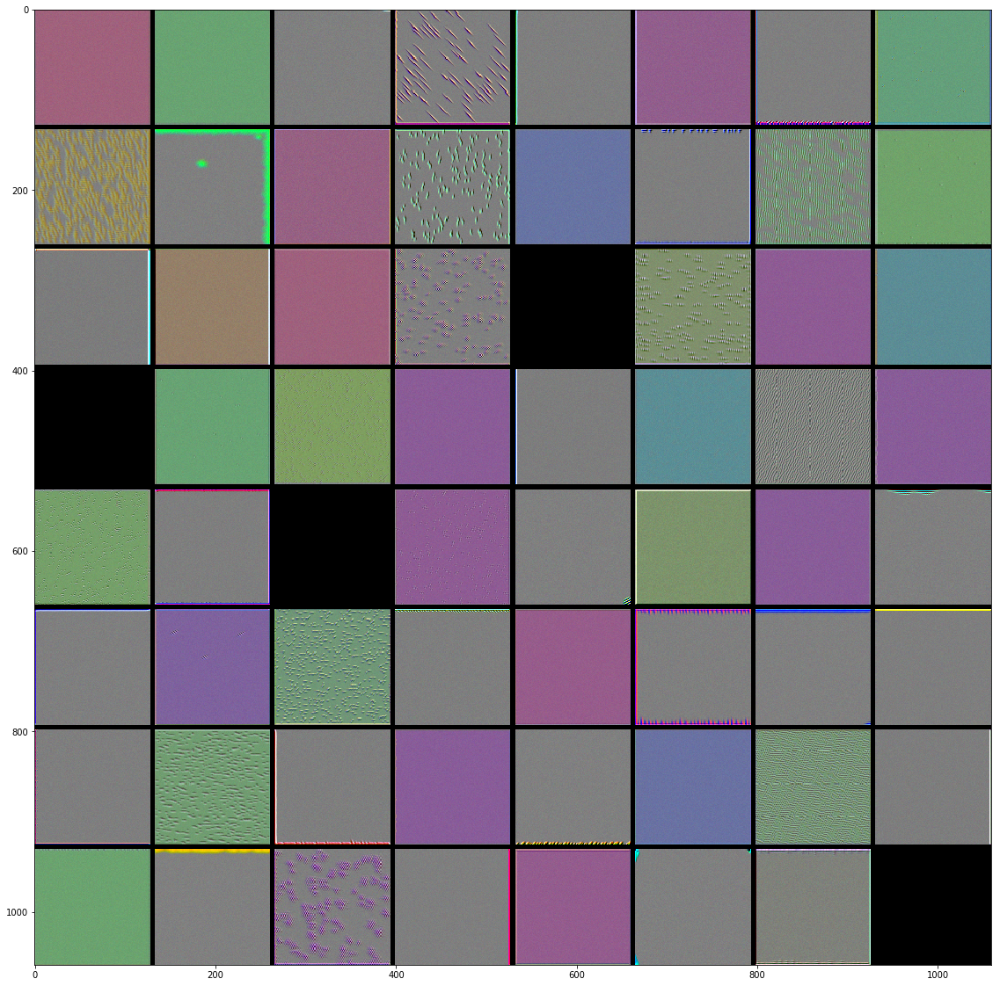

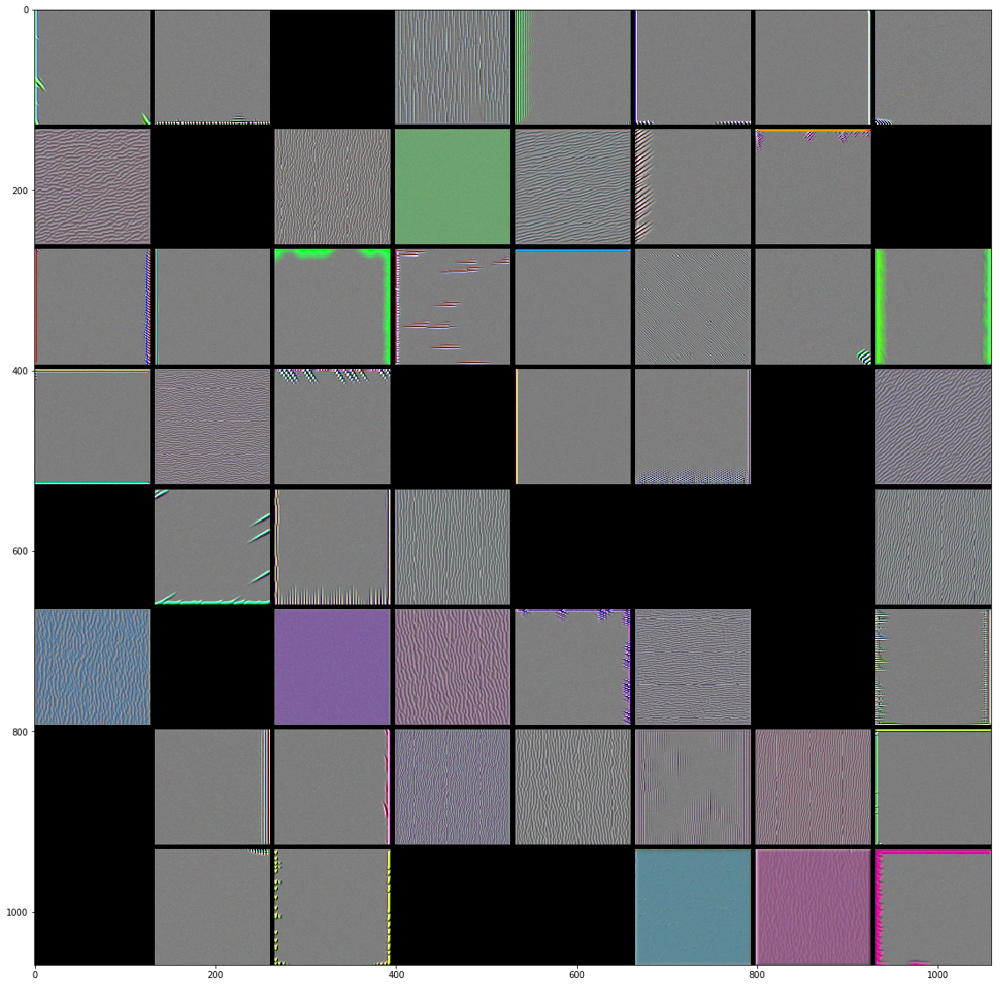

KeyboardInterrupt: 

In [16]:

from keras import backend as K

def deprocess_image(x):
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1
    x += 0.5
    x = np.clip(x, 0, 1)
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x
    
def generate_pattern(layer_name, filter_index, size=150):
    #layer_output = model.get_layer(layer_name).output
    layer_output = layer_name.get_output_at(0)
    loss = K.mean(layer_output[:, :, :, filter_index])
    grads = K.gradients(loss, model.input)[0]
    grads /= (K.sqrt(K.mean(K.square(grads))))
    iterate = K.function([model.input], [loss, grads])
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.
    step = 1
    
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)
    
for layer_name in model.layers[:6]:
    print(layer_name)
    size = 128
    margin = 5
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))
    
    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i + (j * 8), size = size)
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            results = results.astype(np.int32)
            
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()
